<a href="https://colab.research.google.com/github/sprashant19/Customer_lifetime_value/blob/main/CLTV.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#Importing the necessary modules
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go

In [2]:
#Importing the train data
train=pd.read_csv("/content/train_BRCpofr.csv")
train

,id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy,cltv
0,1,Male,Urban,Bachelor,5L-10L,1,5,5790,More than 1,A,Platinum,64308
1,2,Male,Rural,High School,5L-10L,0,8,5080,More than 1,A,Platinum,515400
2,3,Male,Urban,Bachelor,5L-10L,1,8,2599,More than 1,A,Platinum,64212
3,4,Female,Rural,High School,5L-10L,0,7,0,More than 1,A,Platinum,97920
4,5,Male,Urban,High School,More than 10L,1,6,3508,More than 1,A,Gold,59736
...,...,...,...,...,...,...,...,...,...,...,...,...
89387,89388,Male,Rural,High School,More than 10L,0,6,0,More than 1,B,Platinum,95736
89388,89389,Male,Urban,Bachelor,5L-10L,1,0,3897,More than 1,A,Platinum,67596
89389,89390,Female,Urban,Bachelor,5L-10L,0,4,3363,More than 1,B,Platinum,114120
89390,89391,Female,Rural,High School,2L-5L,0,8,0,More than 1,B,Platinum,71772


In [3]:
train.shape

(89392, 12)

In [4]:
train.columns

Index(['id', 'gender', 'area', 'qualification', 'income', 'marital_status',
       'vintage', 'claim_amount', 'num_policies', 'policy', 'type_of_policy',
       'cltv'],
      dtype='object')

In [5]:
train.dtypes

id                 int64
gender            object
area              object
qualification     object
income            object
marital_status     int64
vintage            int64
claim_amount       int64
num_policies      object
policy            object
type_of_policy    object
cltv               int64
dtype: object

In [6]:
train.isna().sum()

id                0
gender            0
area              0
qualification     0
income            0
marital_status    0
vintage           0
claim_amount      0
num_policies      0
policy            0
type_of_policy    0
cltv              0
dtype: int64

In [7]:
data=train

**EDA**

In [8]:
fig=px.histogram(data,x="gender",y="cltv",color="gender",title="<b>cltv VS gender")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig

**Interpretation:** 
Customer Lifetime Value denoted by CLTV is  more for Male than there counterpart.

In [9]:
fig=px.histogram(data,x="area",y="cltv",color="area",title="<b>cltv VS area")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig

**Interpretaion: **


Customers from Urban are more likely to buy the policy than the people in the rural area.

In [10]:
fig=px.histogram(data,x="qualification",y="cltv",color="qualification",title="<b>cltv VS qualification")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig

**Interpration :**
Customers who went to the high school are more likely to buy policies more  than the Bachelors. And the others are least likely to buy a policy.

In [11]:
fig=px.histogram(data,x="income",y="cltv",color="income",title="<b>cltv VS income")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig

Interpretation: 
Cusotmers whose annual income is 5L-10L are buying the policy in highest count and then the cusotmers with income of 2L-5L. And the cusotmers below 2L are less likely to buy a policy.

In [12]:
fig=px.histogram(data,x="marital_status",y="cltv",color="marital_status",title="<b>cltv VS marital_status")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig

Interpretaion:
Customers who are married are buying the policies more than the unmarried ones.

In [13]:
fig=px.histogram(data,x="vintage",y="cltv",color="vintage",title="<b>cltv VS vintage")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig

Interpretation:
Customers who are buying policies for last 6 years are the highest in number and customers who have bought the policy in less than 1 year are the least.


In [14]:
fig=px.histogram(data,x="num_policies",y="cltv",color="num_policies",title="<b>cltv VS num_policies")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig

Interpretation:
Customers buy more than one ploicy from the organisation, that shows the organisation offers variety of policies that are suitable for the customers.

In [15]:
fig=px.histogram(data,x="policy",y="cltv",color="policy",title="<b>cltv VS policy")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig

Interpretation:
Customers buy Policy A more than the other two policies such as B and C. And they buy policy C the least.


In [16]:
fig=px.histogram(data,x="type_of_policy",y="cltv",color="type_of_policy",title="<b>cltv VS type_of_policy")
fig.update_layout(xaxis={'categoryorder':'total descending'})
fig

Interpretation:
Platinum policy is most sold policy and silver policy is the least sold one.


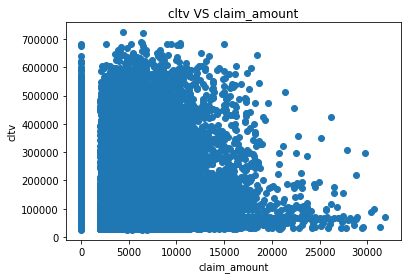

In [17]:
plt.scatter(data["claim_amount"],data["cltv"])
plt.xlabel("claim_amount")
plt.ylabel("cltv")
plt.title("cltv VS claim_amount")
plt.show()

**Encoding**

In [18]:
from sklearn.preprocessing import OneHotEncoder
train = pd.get_dummies(train[['id','gender', 'area','qualification', 'income', 'marital_status', 'vintage', 'claim_amount','num_policies','policy','type_of_policy','cltv']])

In [19]:
train.corr()

,id,marital_status,vintage,claim_amount,cltv,gender_Female,gender_Male,area_Rural,area_Urban,qualification_Bachelor,...,income_<=2L,income_More than 10L,num_policies_1,num_policies_More than 1,policy_A,policy_B,policy_C,type_of_policy_Gold,type_of_policy_Platinum,type_of_policy_Silver
id,1.000000,0.000171,-0.005824,0.003634,-0.004223,0.000215,-0.000215,-0.000073,0.000073,0.003358,...,-0.005243,0.004789,0.004105,-0.004105,0.000334,-0.001300,0.001462,0.000920,-0.005496,0.005552
marital_status,0.000171,1.000000,-0.011686,-0.114924,-0.077744,-0.070468,0.070468,0.048739,-0.048739,0.015744,...,-0.009521,-0.008394,0.082363,-0.082363,0.029833,-0.042759,0.016472,0.014407,-0.015609,0.004057
vintage,-0.005824,-0.011686,1.000000,0.009579,0.020608,-0.005827,0.005827,-0.001145,0.001145,0.027646,...,0.005197,-0.003478,-0.050699,0.050699,-0.073758,0.094780,-0.023712,-0.001513,-0.009788,0.013016
claim_amount,0.003634,-0.114924,0.009579,1.000000,0.180344,-0.049773,0.049773,-0.451054,0.451054,-0.046636,...,0.076035,-0.122582,-0.155281,0.155281,0.148427,-0.163355,0.005137,0.013483,0.007126,-0.021770
cltv,-0.004223,-0.077744,0.020608,0.180344,1.000000,0.001318,-0.001318,-0.133107,0.133107,0.005511,...,0.021668,-0.039879,-0.360414,0.360414,0.035181,-0.058261,0.031613,0.008627,0.021295,-0.033617
gender_Female,0.000215,-0.070468,-0.005827,-0.049773,0.001318,1.000000,-1.000000,0.042516,-0.042516,-0.036120,...,0.036624,0.012460,-0.052871,0.052871,0.007721,-0.003375,-0.007699,0.000745,-0.015893,0.017956
gender_Male,-0.000215,0.070468,0.005827,0.049773,-0.001318,-1.000000,1.000000,-0.042516,0.042516,0.036120,...,-0.036624,-0.012460,0.052871,-0.052871,-0.007721,0.003375,0.007699,-0.000745,0.015893,-0.017956
area_Rural,-0.000073,0.048739,-0.001145,-0.451054,-0.133107,0.042516,-0.042516,1.000000,-1.000000,0.042854,...,-0.093010,0.159729,0.121898,-0.121898,-0.154533,0.176116,-0.014745,-0.013568,-0.014939,0.031046
area_Urban,0.000073,-0.048739,0.001145,0.451054,0.133107,-0.042516,0.042516,-1.000000,1.000000,-0.042854,...,0.093010,-0.159729,-0.121898,0.121898,0.154533,-0.176116,0.014745,0.013568,0.014939,-0.031046
qualification_Bachelor,0.003358,0.015744,0.027646,-0.046636,0.005511,-0.036120,0.036120,0.042854,-0.042854,1.000000,...,-0.010141,0.010687,-0.023337,0.023337,-0.053618,0.080095,-0.034650,-0.020399,-0.019506,0.043201


**Splitting the Data**

In [20]:
x=train[['id', 'marital_status', 'vintage', 'claim_amount','gender_Female', 'gender_Male', 'area_Rural', 'area_Urban','qualification_Bachelor', 'qualification_High School','qualification_Others', 'income_2L-5L', 'income_5L-10L', 'income_<=2L','income_More than 10L', 'num_policies_1', 'num_policies_More than 1','policy_A', 'policy_B', 'policy_C', 'type_of_policy_Gold','type_of_policy_Platinum', 'type_of_policy_Silver']].values
y=train["cltv"].values

In [21]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.25)

**Scaling the Data**

In [22]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit(x_train,y_train)
x_train_scaled=scaler.transform(x_train)
x_test_scaled=scaler.transform(x_test)

**Linear Regression Model**





In [23]:
from sklearn.linear_model import LinearRegression
regressor=LinearRegression()
regressor.fit(x_train_scaled,y_train)

LinearRegression()

In [24]:
coeff_df=pd.DataFrame(regressor.coef_,['id', 'marital_status', 'vintage', 'claim_amount','gender_Female', 'gender_Male', 'area_Rural', 'area_Urban','qualification_Bachelor', 'qualification_High School','qualification_Others', 'income_2L-5L', 'income_5L-10L', 'income_<=2L','income_More than 10L', 'num_policies_1', 'num_policies_More than 1','policy_A', 'policy_B', 'policy_C', 'type_of_policy_Gold','type_of_policy_Platinum', 'type_of_policy_Silver'],columns=['Coefficient'])
y_pred=regressor.predict(x_test_scaled)
coeff_df

,Coefficient
id,-1.410017e+02
marital_status,-3.656410e+03
vintage,4.802502e+02
claim_amount,8.355122e+03
gender_Female,3.038848e+15
gender_Male,3.038848e+15
area_Rural,-2.370791e+16
area_Urban,-2.370791e+16
qualification_Bachelor,-5.486576e+15
qualification_High School,-5.522009e+15


In [25]:
regressor.intercept_

98049.25215606557

In [26]:
df=pd.DataFrame({'Actual':y_test,'Predicted':y_pred})
df

,Actual,Predicted
0,60072,138302.056541
1,68448,117198.056541
2,60996,108770.056541
3,217716,130740.532729
4,64680,128840.532729
...,...,...
22343,99528,130054.532729
22344,31164,59414.056541
22345,92640,117318.056541
22346,101712,131829.056541


In [27]:
from sklearn import metrics
print("R2 Score : ",metrics.r2_score(y_test,y_pred))

R2 Score :  0.15328771622368553


**KNN Model**

In [28]:
from sklearn.neighbors import KNeighborsRegressor
knn=KNeighborsRegressor(n_neighbors=3)
knn.fit(x_train_scaled,y_train)

KNeighborsRegressor(n_neighbors=3)

In [29]:
y_predknn=knn.predict(x_test)
y_pred

array([138302.05654107, 117198.05654107, 108770.05654107, ...,
       117318.05654107, 131829.05654107, 125414.05654107])

In [30]:
df=pd.DataFrame({'Actual':y_test,'Predicted':y_predknn})
df

,Actual,Predicted
0,60072,147332.0
1,68448,52988.0
2,60996,52988.0
3,217716,147332.0
4,64680,147332.0
...,...,...
22343,99528,147332.0
22344,31164,53632.0
22345,92640,147332.0
22346,101712,147332.0


**Decision Tree Model**

In [31]:
from sklearn.tree import DecisionTreeRegressor
dtr=DecisionTreeRegressor(max_depth=3)
dtr.fit(x_train,y_train)

DecisionTreeRegressor(max_depth=3)

In [32]:
y_preddtr=dtr.predict(x_test)
y_preddtr

array([149203.0335019 , 115773.44837627, 115773.44837627, ...,
       115773.44837627, 149203.0335019 , 115773.44837627])

In [33]:
df=pd.DataFrame({'Actual':y_test,'Predicted':y_preddtr})
df

,Actual,Predicted
0,60072,149203.033502
1,68448,115773.448376
2,60996,115773.448376
3,217716,149203.033502
4,64680,98187.881867
...,...,...
22343,99528,131009.080034
22344,31164,50978.200846
22345,92640,115773.448376
22346,101712,149203.033502


In [34]:
#Evaluation Metrics
from sklearn import metrics
print("R2 Score : ",metrics.r2_score(y_test,y_preddtr))

R2 Score :  0.15144079959916246


**Random Forest**

In [35]:
from sklearn.ensemble import RandomForestRegressor
rf=RandomForestRegressor(n_estimators=100,max_depth=3,max_features='sqrt')
rf.fit(x_train_scaled,y_train)

RandomForestRegressor(max_depth=3, max_features='sqrt')

In [36]:
y_predrf=rf.predict(x_test_scaled)
y_predrf

array([127616.30840165, 114766.09225003, 110240.40382631, ...,
       115237.42380026, 125428.98811822, 115962.71533562])

In [37]:
print("R2 Score : ",metrics.r2_score(y_test,y_predrf))

R2 Score :  0.13802414008652242


**TEST DATA**

In [38]:
test = pd.read_csv("/content/test_koRSKBP.csv")
test

,id,gender,area,qualification,income,marital_status,vintage,claim_amount,num_policies,policy,type_of_policy
0,89393,Female,Rural,High School,5L-10L,0,6,2134,More than 1,B,Silver
1,89394,Female,Urban,High School,2L-5L,0,4,4102,More than 1,A,Platinum
2,89395,Male,Rural,High School,5L-10L,1,7,2925,More than 1,B,Gold
3,89396,Female,Rural,Bachelor,More than 10L,1,2,0,More than 1,B,Silver
4,89397,Female,Urban,High School,2L-5L,0,5,14059,More than 1,B,Silver
...,...,...,...,...,...,...,...,...,...,...,...
59590,148983,Male,Rural,Bachelor,5L-10L,1,6,0,1,A,Silver
59591,148984,Male,Urban,High School,5L-10L,0,6,0,1,C,Gold
59592,148985,Female,Urban,High School,2L-5L,1,4,3323,More than 1,B,Platinum
59593,148986,Male,Rural,Bachelor,5L-10L,0,1,2886,More than 1,A,Silver


In [39]:
from sklearn.preprocessing import OneHotEncoder
test = pd.get_dummies(test[['id','gender','area','qualification', 'income', 'marital_status', 'vintage', 'claim_amount','num_policies','policy','type_of_policy']])


In [40]:
test

,id,marital_status,vintage,claim_amount,gender_Female,gender_Male,area_Rural,area_Urban,qualification_Bachelor,qualification_High School,...,income_<=2L,income_More than 10L,num_policies_1,num_policies_More than 1,policy_A,policy_B,policy_C,type_of_policy_Gold,type_of_policy_Platinum,type_of_policy_Silver
0,89393,0,6,2134,1,0,1,0,0,1,...,0,0,0,1,0,1,0,0,0,1
1,89394,0,4,4102,1,0,0,1,0,1,...,0,0,0,1,1,0,0,0,1,0
2,89395,1,7,2925,0,1,1,0,0,1,...,0,0,0,1,0,1,0,1,0,0
3,89396,1,2,0,1,0,1,0,1,0,...,0,1,0,1,0,1,0,0,0,1
4,89397,0,5,14059,1,0,0,1,0,1,...,0,0,0,1,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59590,148983,1,6,0,0,1,1,0,1,0,...,0,0,1,0,1,0,0,0,0,1
59591,148984,0,6,0,0,1,0,1,0,1,...,0,0,1,0,0,0,1,1,0,0
59592,148985,1,4,3323,1,0,0,1,0,1,...,0,0,0,1,0,1,0,0,1,0
59593,148986,0,1,2886,0,1,1,0,1,0,...,0,0,0,1,1,0,0,0,0,1


In [41]:
y_test_rfpred=dtr.predict(test)

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names



In [42]:
test['cltv'] = y_test_rfpred

In [43]:
test.drop(['marital_status','vintage','claim_amount','qualification_Bachelor','qualification_High School','qualification_Others','income_2L-5L','income_5L-10L','income_<=2L','income_More than 10L','num_policies_1','num_policies_More than 1','policy_A','policy_B','policy_C','type_of_policy_Gold','type_of_policy_Platinum','type_of_policy_Silver','gender_Female','gender_Male','area_Rural','area_Urban'	],axis =1, inplace=True)

In [44]:
test

,id,cltv
0,89393,98187.881867
1,89394,115773.448376
2,89395,98187.881867
3,89396,98187.881867
4,89397,149203.033502
...,...,...
59590,148983,47624.399434
59591,148984,47624.399434
59592,148985,115773.448376
59593,148986,98187.881867


In [46]:
test.to_csv("submission.csv")